In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
ORG_NAME = "MetaCartel - MetaCartel Ventures"
SPLITS_FREQ = "W-THU"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2022-01-06"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'MetaCartel - MetaCartel Ventures/LightGCN_W-THU_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,20,5,0.230818,2.308182e-01,2.022668e-07,0.005495,0.142857,0.142857,0.142857,0.142857,...,147.96.81.131,0.373344,1,7,2,2,0.0690,1.028204e-07,21d,2021-11-04T00:00:00
1,20,10,0.037361,3.735988e-02,6.774569e-07,0.005495,0.142857,0.142857,0.142857,0.142857,...,147.96.81.131,0.534946,2,7,2,2,0.0690,1.028204e-07,21d,2021-11-04T00:00:00
2,20,15,0.023728,2.372719e-02,9.116819e-07,0.005495,0.142857,0.142857,0.142857,0.142857,...,147.96.81.131,0.694865,3,7,2,2,0.0690,1.028204e-07,21d,2021-11-04T00:00:00
3,20,20,0.069784,6.978330e-02,9.621180e-07,0.005495,0.142857,0.142857,0.142857,0.142857,...,147.96.81.131,0.858176,4,7,2,2,0.0690,1.028204e-07,21d,2021-11-04T00:00:00
4,20,25,0.005170,5.169209e-03,1.073437e-06,0.005495,0.142857,0.142857,0.142857,0.142857,...,147.96.81.131,1.026018,5,7,2,2,0.0690,1.028204e-07,21d,2021-11-04T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,20,180,0.000096,1.546687e-06,9.463690e-05,0.023352,0.285714,0.285714,0.285714,0.285714,...,147.96.81.131,5.935939,36,8,9,4,0.2997,1.290228e-06,21d,2021-11-04T00:00:00
36,20,185,0.000105,1.164570e-05,9.365918e-05,0.023352,0.285714,0.285714,0.285714,0.285714,...,147.96.81.131,6.096860,37,8,9,4,0.2997,1.290228e-06,21d,2021-11-04T00:00:00
37,20,190,0.000125,2.326293e-05,1.012826e-04,0.023352,0.285714,0.285714,0.285714,0.285714,...,147.96.81.131,6.259213,38,8,9,4,0.2997,1.290228e-06,21d,2021-11-04T00:00:00
38,20,195,0.000090,2.954195e-08,8.952813e-05,0.023352,0.285714,0.285714,0.285714,0.285714,...,147.96.81.131,6.419873,39,8,9,4,0.2997,1.290228e-06,21d,2021-11-04T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
25,47,130,0.016219,0.009897,0.006322,1.0,1.0,0.6,0.3,0.2,...,3.276457,False,a550404b,1024,19,1,0.0028,0.000626,60d,2021-12-30
26,47,135,0.019041,0.012628,0.006413,1.0,1.0,0.6,0.3,0.2,...,3.421764,False,a550404b,1024,19,1,0.0028,0.000626,60d,2021-12-30
27,47,140,0.016760,0.010344,0.006416,1.0,1.0,0.6,0.3,0.2,...,3.546511,False,a550404b,1024,19,1,0.0028,0.000626,60d,2021-12-30
2,27,15,0.073521,0.072889,0.000633,1.0,1.0,0.6,0.3,0.2,...,0.402956,False,f63d744b,1024,4,4,0.0519,0.000055,21d,2021-12-30
12,57,65,0.013962,0.013731,0.000231,1.0,1.0,0.6,0.3,0.2,...,1.596382,False,f1b8f55a,64,950,3,0.0011,0.000013,90d,2021-12-30


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2021-11-04    100
2021-11-11    100
2021-11-18    100
2021-11-25    100
2021-12-02    100
2021-12-09    100
2021-12-16    100
2021-12-23    100
2021-12-30    100
2022-01-06    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
002109ba  128                34                    2                   0.0091                7.608004e-04  60d                 2021-11-18     1.274077
002d21a3  512                86                    3                   0.0002                1.667490e-04  30d                 2021-12-02     1.484167
010b2bfb  64                 724                   2                   0.0001                9.159073e-04  90d                 2022-01-06     1.519891
01125a64  1024               52                    3                   0.0048                9.858246e-06  90d                 2021-12-09     1.548510
018b9369  64                 71                    1                   0.0206                1.324063e-04  60d                 2021-11-18     1.241776
                                                                                                          

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.0
mean      200.0
std         0.0
min       200.0
25%       200.0
50%       200.0
75%       200.0
max       200.0
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.285714
precision@3        0.142857
precision@5        0.085714
precision@10       0.042857
precision@15       0.028571
precision@100      0.004286
ndcg@1             0.235714
ndcg@3             0.244728
ndcg@5             0.244728
ndcg@10            0.244728
ndcg@15            0.244728
ndcg@100           0.244728
map@1              0.285714
map@3              0.292857
map@5              0.292857
map@10             0.292857
map@15             0.292857
map@100            0.292857
recall@1           0.221429
recall@3           0.300000
recall@5           0.300000
recall@10          0.300000
recall@15          0.300000
recall@100         0.300000
r-precision@1      0.233333
r-precision@3      0.300000
r-precision@5      0.300000
r-precision@10     0.300000
r-precision@15     0.300000
r-precision@100    0.300000
time_eval          0.085921
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.068426
2023-05-11,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.069319
2023-05-18,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.069076
2023-05-25,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,0.117170
2023-06-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.068315
2023-06-08,0.857143,0.428571,0.257143,0.128571,0.085714,0.012857,0.857143,0.947276,0.947276,0.947276,...,1.0,1.0,1.0,0.833333,1.0,1.0,1.0,1.0,1.0,0.123541
2023-06-15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.081273
2023-06-22,1.000000,0.666667,0.400000,0.200000,0.133333,0.020000,0.500000,0.500000,0.500000,0.500000,...,1.0,1.0,1.0,0.500000,1.0,1.0,1.0,1.0,1.0,0.121736
2023-06-29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.070027


(0.0, 1.0)

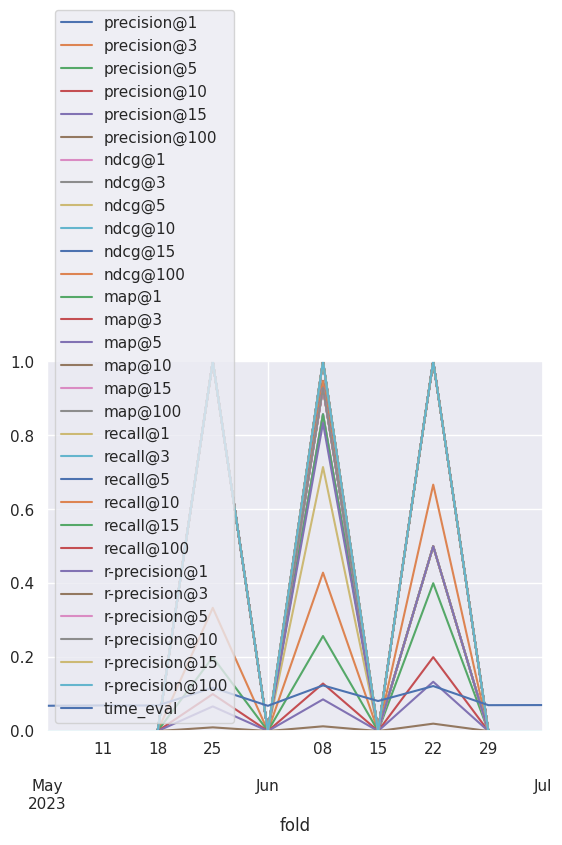

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        0.400000
precision@3        0.159524
precision@5        0.095714
precision@10       0.047857
precision@15       0.031905
precision@100      0.004786
ndcg@1             0.400000
ndcg@3             0.400000
ndcg@5             0.400000
ndcg@10            0.400000
ndcg@15            0.400000
ndcg@100           0.400000
map@1              0.400000
map@3              0.400000
map@5              0.400000
map@10             0.400000
map@15             0.400000
map@100            0.400000
recall@1           0.360714
recall@3           0.400000
recall@5           0.400000
recall@10          0.400000
recall@15          0.400000
recall@100         0.400000
r-precision@1      0.360714
r-precision@3      0.400000
r-precision@5      0.400000
r-precision@10     0.400000
r-precision@15     0.400000
r-precision@100    0.400000
time_eval          0.093174
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-04,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.072593
2023-05-11,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.073218
2023-05-18,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.074901
2023-05-25,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,0.119591
2023-06-01,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.072319
2023-06-08,1.0,0.428571,0.257143,0.128571,0.085714,0.012857,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.857143,1.0,1.0,1.0,1.0,1.0,0.127007
2023-06-15,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,0.119853
2023-06-22,1.0,0.500000,0.300000,0.150000,0.100000,0.015000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.750000,1.0,1.0,1.0,1.0,1.0,0.124992
2023-06-29,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.073968


(0.0, 1.0)

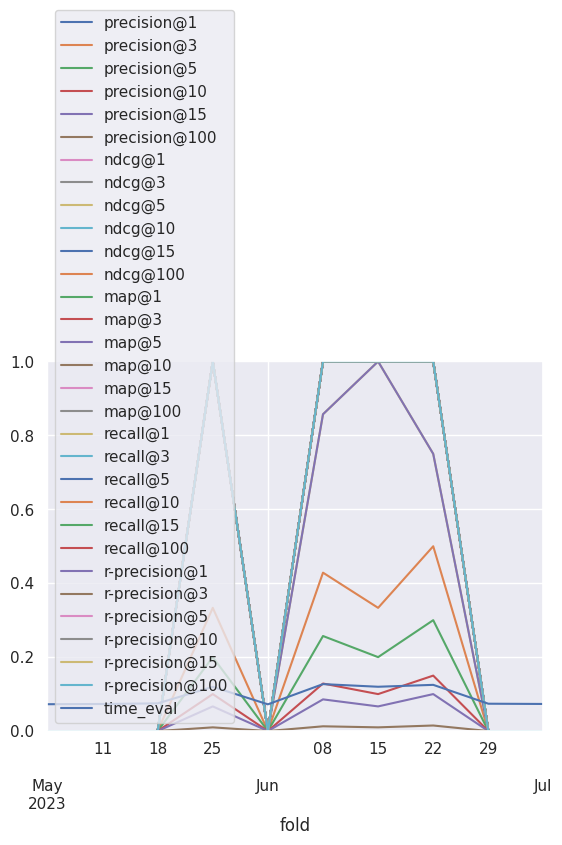

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,20,25,0.005170,0.005169,1.073437e-06,0.005495,0.142857,0.142857,0.142857,0.142857,...,1.026018,5,7,2,2,0.0690,1.028204e-07,21d,2021-11-04T00:00:00,d3934479
1,32,70,0.003899,0.000311,3.588857e-03,0.166209,0.428571,0.428571,0.428571,0.571429,...,2.525539,14,7,195,4,0.0507,9.011207e-05,30d,2021-11-04T00:00:00,a663abb0
2,61,5,0.682070,0.682070,1.318598e-07,0.000000,0.000000,0.000000,0.000000,0.285714,...,0.385046,1,10,12,3,0.0004,3.214525e-07,90d,2021-11-04T00:00:00,b0499813
3,54,5,0.635049,0.635048,1.604025e-06,0.000000,0.000000,0.000000,0.000000,0.142857,...,0.375812,1,10,4,3,0.0094,5.037199e-06,60d,2021-11-04T00:00:00,2344ab58
4,32,200,0.000933,0.000538,3.946833e-04,0.023352,0.285714,0.285714,0.285714,0.285714,...,6.785865,40,9,115,4,0.0079,1.759346e-05,30d,2021-11-04T00:00:00,fc9ad34f
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,46,5,0.654181,0.654178,3.707930e-06,0.000000,0.000000,0.000000,0.000000,0.500000,...,0.331266,1,6,13,1,0.0012,6.761532e-06,60d,2022-01-06T00:00:00,94bc3b10
96,52,25,0.379904,0.379326,5.781979e-04,0.000000,0.000000,0.000000,0.000000,1.000000,...,1.043008,5,6,602,1,0.0002,1.634943e-04,90d,2022-01-06T00:00:00,e247dcf2
97,52,25,0.005679,0.005674,4.856273e-06,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.999120,5,7,10,3,0.0693,1.839829e-07,90d,2022-01-06T00:00:00,6044b5cf
98,46,195,0.013478,0.002100,1.137732e-02,0.000000,0.000000,0.000000,0.000000,0.500000,...,6.465316,39,7,34,2,0.0091,7.608004e-04,60d,2022-01-06T00:00:00,76302858


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2021-11-04 128        2             2           0.0690        1.028204e-07 21d                  5   
                                                                           21d                 10   
                                                                           21d                 15   
                                                                           21d                 20   
                                                                           21d                 25   
...                                                                                           ...   
2022-01-06 64         12            2           0.0386        1.188360e-05 90d                180   
                                                                           90d                185   
                                                                           90d                190   
                                                                           90d                195   
                                                                           90d                200   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2021-11-04 128        2             2           0.0690        1.028204e-07 21d          0.230818   
                                                                           21d          0.037361   
                                                                           21d          0.023728   
                                                                           21d          0.069784   
                                                                           21d          0.005170   
...                                                                                          ...   
2022-01-06 64         12            2           0.0386        1.188360e-05 90d          0.000490   
                                                                           90d          0.000470   
                                                                           90d          0.000519   
                                                                           90d          0.000459   
                                                                           90d          0.000594   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2021-11-04 128        2             2           0.0690        1.028204e-07 21d          0.230818   
                                                                           21d          0.037360   
                                                                           21d          0.023727   
                                                                           21d          0.069783   
                                                                           21d          0.005169   
...                                                                                          ...   
2022-01-06 64         12            2           0.0386        1.188360e-05 90d          0.000097   
                                                                           90d          0.000082   
                                                                           90d          0.000127   
                                                                           90d          0.000068   
                                                                           90d          0.000191   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2    

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/MetaCartel - MetaCartel Ventures/models/lightgcn-all_W-THU_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2021-11-11 128        4             4           0.0078        1.941390e-05 90d                 30   
                      3             3           0.0044        1.741890e-06 21d                190   
           256        17            4           0.0008        4.229384e-05 10YE               140   
           128        8             4           0.0339        2.214447e-07 10YE               140   
                      97            4           0.0021        6.099319e-05 10YE               200   
...                                                                                           ...   
2021-12-30 128        971           3           0.0009        8.497583e-06 90d                130   
2022-01-06 128        3             1           0.0108        6.954491e-05 90d                 60   
2021-12-30 1024       19            1           0.0028        6.258077e-04 60d                140   
                      4             4           0.0519        5.523198e-05 21d                 15   
           64         950           3           0.0011        1.272843e-05 90d                 65   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2021-11-11 128        4             4           0.0078        1.941390e-05 90d          0.121796   
                      3             3           0.0044        1.741890e-06 21d          0.030017   
           256        17            4           0.0008        4.229384e-05 10YE         0.102896   
           128        8             4           0.0339        2.214447e-07 10YE         0.014134   
                      97            4           0.0021        6.099319e-05 10YE         0.013827   
...                                                                                          ...   
2021-12-30 128        971           3           0.0009        8.497583e-06 90d          0.002611   
2022-01-06 128        3             1           0.0108        6.954491e-05 90d          0.043216   
2021-12-30 1024       19            1           0.0028        6.258077e-04 60d          0.016760   
                      4             4           0.0519        5.523198e-05 21d          0.073521   
           64         950           3           0.0011        1.272843e-05 90d          0.013962   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2021-11-11 128        4             4           0.0078        1.941390e-05 90d          0.121698   
                      3             3           0.0044        1.741890e-06 21d          0.029995   
           256        17            4           0.0008        4.229384e-05 10YE         0.102446   
           128        8             4           0.0339        2.214447e-07 10YE         0.014118   
                      97            4           0.0021        6.099319e-05 10YE         0.011386   
...                                                                                          ...   
2021-12-30 128        971           3           0.0009        8.497583e-06 90d          0.002419   
2022-01-06 128        3             1           0.0108        6.954491e-05 90d          0.042690   
2021-12-30 1024       19            1           0.0028        6.258077e-04 60d          0.010344   
                      4             4           0.0519        5.523198e-05 21d          0.072889   
           64         950           3           0.0011        1.272843e-05 90d          0.013731   

                                                                                        emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2        

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/MetaCartel - MetaCartel Ventures/models/lightgcn-best-val_W-THU_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2021-11-04,128,195,4,0.0507,9.011207e-05,30d,70,0.003899,0.000311,0.003589,0.571429,0.333333,0.342857,0.242857,0.219048,0.068571,0.571429,...,0.460385,0.540769,0.603846,0.626923,0.703846,0.001265,0.421696,1.898242,False,a663abb0
2021-11-11,256,32,4,0.0150,1.242024e-06,10YE,190,0.001223,0.001116,0.000107,0.500000,0.250000,0.200000,0.175000,0.116667,0.022500,0.500000,...,0.583333,0.583333,0.583333,0.583333,0.583333,0.002213,3.799972,4.756667,False,c78b3c0c
2021-11-18,64,53,2,0.0079,3.503044e-07,60d,195,0.000400,0.000391,0.000009,0.714286,0.333333,0.200000,0.100000,0.095238,0.017143,0.714286,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001217,1.210378,5.257948,False,125e8f4d
2021-11-25,256,27,2,0.2056,3.060065e-05,30d,145,0.002892,0.000002,0.002890,0.666667,0.333333,0.200000,0.100000,0.066667,0.010000,0.666667,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001425,1.114978,3.690365,False,0edef47b
2021-12-02,256,2,2,0.0009,9.793146e-04,10YE,85,0.231230,0.227992,0.003238,0.818182,0.424242,0.272727,0.163636,0.109091,0.016364,0.818182,...,0.907407,0.907407,0.907407,0.907407,0.907407,0.001415,1.832307,2.260728,False,c1207c7a
2021-12-09,512,5,1,0.0051,6.087459e-07,21d,130,0.018713,0.018709,0.000005,1.000000,0.833333,0.700000,0.400000,0.266667,0.040000,1.000000,...,0.500000,0.666667,0.750000,0.750000,0.750000,0.001071,0.593266,3.290569,False,a7d74b28
2021-12-16,1024,34,4,0.0587,1.516143e-06,21d,25,0.020456,0.020402,0.000054,1.000000,0.555556,0.466667,0.233333,0.200000,0.030000,1.000000,...,0.555556,0.555556,0.555556,0.555556,0.555556,0.001247,0.233778,0.624735,False,3bd245cb
2021-12-23,64,58,1,0.0431,4.751813e-03,10YE,200,0.115908,0.026038,0.089870,0.714286,0.428571,0.285714,0.171429,0.114286,0.017143,0.714286,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002445,8.441702,5.404439,True,1c59adf4
2021-12-30,64,950,3,0.0011,1.272843e-05,90d,65,0.013962,0.013731,0.000231,1.000000,1.000000,0.600000,0.300000,0.200000,0.030000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001271,0.561902,1.596382,False,f1b8f55a


,precision@5,map@10
count,10.000000,10.000000
mean,0.346797,0.784792
std,0.182167,0.181143
min,0.200000,0.481139
25%,0.200000,0.713095
50%,0.279221,0.818723
75%,0.435714,0.895975
max,0.700000,1.000000


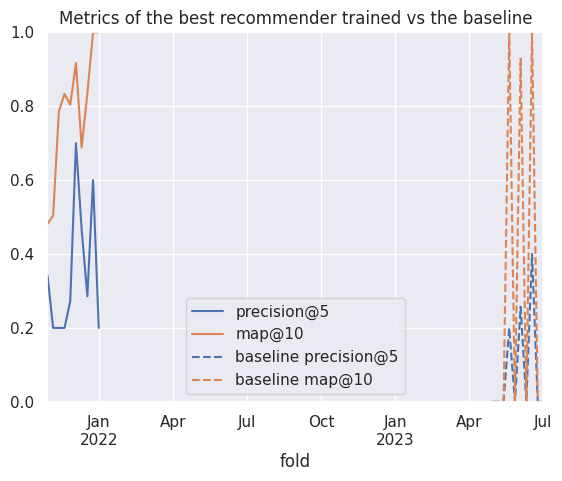

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.346797
ndcg@5          0.817746
precision@10    0.198626
ndcg@10         0.839884
map@5           0.773720
map@10          0.784792
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,20,5,0.230818,0.230818,2.022668e-07,0.142857,0.095238,0.171429,0.171429,0.209524,...,0.139066,False,d3934479,128,2,2,0.0690,1.028204e-07,21d,2021-11-04
1,20,10,0.037361,0.037360,6.774569e-07,0.142857,0.142857,0.200000,0.157143,0.200000,...,0.274862,False,d3934479,128,2,2,0.0690,1.028204e-07,21d,2021-11-04
2,20,15,0.023728,0.023727,9.116819e-07,0.142857,0.095238,0.200000,0.157143,0.180952,...,0.409659,False,d3934479,128,2,2,0.0690,1.028204e-07,21d,2021-11-04
3,20,20,0.069784,0.069783,9.621180e-07,0.142857,0.095238,0.142857,0.185714,0.180952,...,0.543127,False,d3934479,128,2,2,0.0690,1.028204e-07,21d,2021-11-04
4,20,25,0.005170,0.005169,1.073437e-06,0.142857,0.095238,0.142857,0.200000,0.180952,...,0.678851,False,d3934479,128,2,2,0.0690,1.028204e-07,21d,2021-11-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,52,180,0.000490,0.000097,3.935440e-04,0.500000,0.333333,0.200000,0.100000,0.066667,...,4.569881,False,96f275ef,64,12,2,0.0386,1.188360e-05,90d,2022-01-06
36,52,185,0.000470,0.000082,3.877864e-04,0.500000,0.333333,0.200000,0.100000,0.066667,...,4.702074,False,96f275ef,64,12,2,0.0386,1.188360e-05,90d,2022-01-06
37,52,190,0.000519,0.000127,3.921120e-04,0.500000,0.333333,0.200000,0.100000,0.066667,...,4.827580,False,96f275ef,64,12,2,0.0386,1.188360e-05,90d,2022-01-06
38,52,195,0.000459,0.000068,3.915356e-04,0.500000,0.333333,0.200000,0.100000,0.066667,...,4.953142,False,96f275ef,64,12,2,0.0386,1.188360e-05,90d,2022-01-06


Index intersection: MultiIndex([( 256,  32, 4,  '0.015000000000000001', ...),
            ( 512,  26, 2,                '0.6694', ...),
            ( 512, 447, 3,                '0.0008', ...),
            ( 256,  96, 2,                '0.0784', ...),
            (  64, 217, 2,   '0.47850000000000004', ...),
            ( 512,  86, 3,                '0.0002', ...),
            ( 256, 219, 4,                 '0.095', ...),
            (1024,   1, 1, '0.0029000000000000002', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ( 256,  27, 2,                '0.2056', ...),
            ...
            (  64, 217, 2,   '0.47850000000000004', ...),
            ( 512, 447, 3,                '0.0008', ...),
            ( 256,  96, 2,                '0.0784', ...),
            ( 256,  27, 2,                '0.2056', ...),
            ( 256,  32, 4,  '0.015000000000000001', ...),
            ( 512, 665, 3,                '0.0092', ...),
            ( 512,  86, 2, '0.000600

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2             config/window_size config/fold                    
256               32                   4                  0.015000000000000001 1.242023640083893e-06 10YE               2021-11-11               131   
                                                                                                                        2021-11-11               131   
                                                                                                                        2021-11-11               131   
                                                                                                                        2021-11-11               131   
                                                                                                                        2021-11-11               131   
...                                                                                                                                              ...   
128               34                   2                  0.0091               0.0007608003684554223 60d                2022-01-06                46   
                                                                                                                        2022-01-06                46   
                                                                                                                        2022-01-06                46   
                                                                                                                        2022-01-06                46   
                                                                                                                        2022-01-06                46   

                                                                                                                                     config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2             config/window_size config/fold                     
256               32                   4                  0.015000000000000001 1.242023640083893e-06 10YE               2021-11-11                  5   
                                                                                                                        2021-11-11                 10   
                                                                                                                        2021-11-11                 15   
                                                                                                                        2021-11-11                 20   
                                                                                                                        2021-11-11                 25   
...                                                                                                                                               ...   
128               34                   2                  0.0091               0.0007608003684554223 60d                2022-01-06                180   
                                                                                                                        2022-01-06                185   
                                                                                                                        2022-01-06                190   
                                                                                                                        2022-01-06                195   
                                                                                                                        2022-01-06                200   

                                                                                                                                         loss  \
config/batch_size con

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_3812990/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,,,,,,,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_total_train,time_total_test,done,trial_id
config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,,,,,,,,,,,,,,,,,,,,,
128,184,4,0.052000000000000005,8.434417860806083e-05,30d,2021-11-11,32,135,0.008246,0.000059,0.008187,0.428571,0.285714,0.314286,0.271429,0.228571,...,0.553846,0.540769,0.661538,0.684615,0.730769,0.001143,0.684746,3.704061,False,2bd31ca6
256,32,4,0.015000000000000001,1.242023640083893e-06,10YE,2021-11-18,131,190,0.001223,0.001116,0.000107,0.500000,0.250000,0.200000,0.175000,0.116667,...,0.583333,0.583333,0.583333,0.583333,0.583333,0.002213,3.799972,4.756667,False,c78b3c0c
64,53,2,0.0079,3.503044014321727e-07,60d,2021-11-25,51,195,0.000400,0.000391,0.000009,0.714286,0.333333,0.200000,0.100000,0.095238,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001217,1.210378,5.257948,False,125e8f4d
256,27,2,0.2056,3.060064883897499e-05,30d,2021-12-02,29,145,0.002892,0.000002,0.002890,0.666667,0.333333,0.200000,0.100000,0.066667,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001425,1.114978,3.690365,False,0edef47b
128,74,2,0.1736,8.637993900055015e-07,10YE,2021-12-09,128,70,0.289723,0.287432,0.002292,0.818182,0.393939,0.309091,0.163636,0.109091,...,0.740741,0.740741,0.740741,0.740741,0.740741,0.001574,1.494555,1.845061,False,b668a3e6
1024,5,1,0.006500000000000001,2.498594213780349e-06,21d,2021-12-16,31,35,0.151631,0.151623,0.000008,1.000000,0.833333,0.700000,0.400000,0.266667,...,0.500000,0.666667,0.750000,0.750000,0.750000,0.001251,0.274521,0.889338,False,2fcff5fd
512,665,3,0.0092,2.7445636362385535e-05,90d,2021-12-23,68,155,0.001257,0.000130,0.001127,1.000000,0.444444,0.400000,0.266667,0.177778,...,0.472222,0.472222,0.472222,0.472222,0.472222,0.001378,1.170004,4.040237,False,c3d18593
64,58,1,0.0431,0.004751812875985562,10YE,2021-12-30,64,200,0.115908,0.026038,0.089870,0.714286,0.428571,0.285714,0.171429,0.114286,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002445,8.441702,5.404439,True,1c59adf4
128,97,4,0.0021000000000000003,6.099318557930143e-05,10YE,2022-01-06,128,5,0.250439,0.250197,0.000241,1.000000,1.000000,0.600000,0.300000,0.200000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.025905,0.279347,0.127965,False,b7ca7c6d


In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(64, 53, 2, 0.0079, 3.503044014321727e-07, 60d, 2021-11-25 00:00:00)                     40
(64, 58, 1, 0.0431, 0.004751812875985562, 10YE, 2021-12-30 00:00:00)                     40
(128, 74, 2, 0.1736, 8.637993900055015e-07, 10YE, 2021-12-09 00:00:00)                   40
(128, 97, 4, 0.0021000000000000003, 6.099318557930143e-05, 10YE, 2022-01-06 00:00:00)    40
(128, 184, 4, 0.052000000000000005, 8.434417860806083e-05, 30d, 2021-11-11 00:00:00)     40
(256, 27, 2, 0.2056, 3.060064883897499e-05, 30d, 2021-12-02 00:00:00)                    40
(256, 32, 4, 0.015000000000000001, 1.242023640083893e-06, 10YE, 2021-11-18 00:00:00)     80
(512, 665, 3, 0.0092, 2.7445636362385535e-05, 90d, 2021-12-23 00:00:00)                  80
(1024, 5, 1, 0.006500000000000001, 2.498594213780349e-06, 21d, 2021-12-16 00:00:00)      40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2021-11-11,128,184,4,0.052000000000000005,8.434417860806083e-05,30d,22,135,0.013618,0.000010,...,0.553846,0.540769,0.661538,0.684615,0.730769,0.001143,0.684746,3.704061,False,2bd31ca6
2021-11-18,256,32,4,0.015000000000000001,1.242023640083893e-06,10YE,131,190,0.001212,0.001104,...,0.583333,0.583333,0.583333,0.583333,0.583333,0.002213,3.799972,4.756667,False,c78b3c0c
2021-11-25,64,53,2,0.0079,3.503044014321727e-07,60d,51,195,0.000303,0.000294,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001217,1.210378,5.257948,False,125e8f4d
2021-12-02,256,27,2,0.2056,3.060064883897499e-05,30d,31,145,0.017387,0.000672,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001425,1.114978,3.690365,False,0edef47b
2021-12-09,128,74,2,0.1736,8.637993900055015e-07,10YE,128,70,0.160653,0.158278,...,0.740741,0.740741,0.740741,0.740741,0.740741,0.001574,1.494555,1.845061,False,b668a3e6
2021-12-16,1024,5,1,0.006500000000000001,2.498594213780349e-06,21d,29,35,0.212850,0.212841,...,0.500000,0.666667,0.750000,0.750000,0.750000,0.001251,0.274521,0.889338,False,2fcff5fd
2021-12-23,512,665,3,0.0092,2.7445636362385535e-05,90d,66,155,0.001302,0.000137,...,0.472222,0.472222,0.472222,0.472222,0.472222,0.001378,1.170004,4.040237,False,c3d18593
2021-12-30,64,58,1,0.0431,0.004751812875985562,10YE,64,200,0.101992,0.025556,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002445,8.441702,5.404439,True,1c59adf4
2022-01-06,128,97,4,0.0021000000000000003,6.099318557930143e-05,10YE,128,5,0.245525,0.245285,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.025905,0.279347,0.127965,False,b7ca7c6d


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/MetaCartel - MetaCartel Ventures/models/lightgcn-best-test_W-THU_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.215055,0.422670
std,0.166856,0.205311
min,0.000000,0.100000
25%,0.114286,0.354535
50%,0.200000,0.361111
75%,0.254545,0.500000
max,0.600000,0.800000


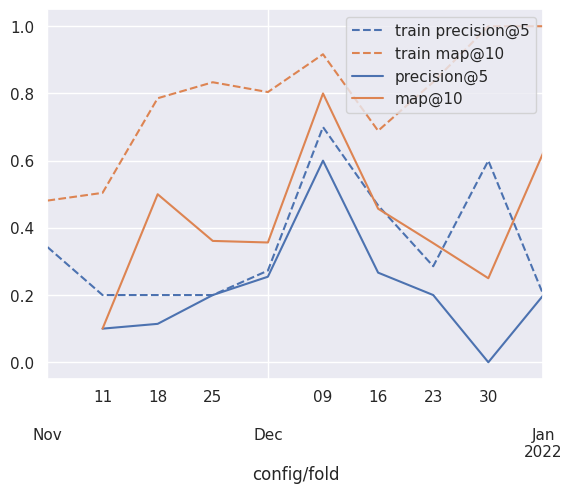

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2021-11-11 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.068426
2023-05-11,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.069319
2023-05-18,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.069076
2023-05-25,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,0.117170
2023-06-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.068315
2023-06-08,0.857143,0.428571,0.257143,0.128571,0.085714,0.012857,0.857143,0.947276,0.947276,0.947276,...,1.0,1.0,1.0,0.833333,1.0,1.0,1.0,1.0,1.0,0.123541
2023-06-15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.081273
2023-06-22,1.000000,0.666667,0.400000,0.200000,0.133333,0.020000,0.500000,0.500000,0.500000,0.500000,...,1.0,1.0,1.0,0.500000,1.0,1.0,1.0,1.0,1.0,0.121736
2023-06-29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.070027


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.10 & 0.05 & 0.40 & 0.40 & 0.40 & 0.40 & 0.40 & 0.40 \\
Leaky GNN & 0.35 & 0.19 & 0.86 & 0.94 & 0.80 & 0.82 & 0.84 & 0.87 \\
GNN & 0.22 & 0.18 & 0.58 & 0.86 & 0.36 & 0.42 & 0.44 & 0.55 \\
OpenPop & 0.09 & 0.04 & 0.30 & 0.30 & 0.29 & 0.29 & 0.24 & 0.24 \\
\end{tabular}



/tmp/ipykernel_3812990/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_3812990/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10          10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             map@5           10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             ndcg@10         10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             ndcg@5          10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             precision@10    10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             precision@5     10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             recall@10       10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             recall@5        10  2023-06-04 12:00:00  2023-05-04 00:00:00   
Leaky GNN    map@10           9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             map@5            9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             ndcg@10          9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             ndcg@5           9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             precision@10     9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             precision@5      9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             recall@10        9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             recall@5         9  2021-12-09 00:00:00  2021-11-11 00:00:00   
GNN          map@10           9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             map@5            9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             ndcg@10          9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             ndcg@5           9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             precision@10     9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             precision@5      9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             recall@10        9  2021-12-09 00:00:00  2021-11-11 00:00:00   
             recall@5         9  2021-12-09 00:00:00  2021-11-11 00:00:00   
OpenPop      map@10          10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             map@5           10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             ndcg@10         10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             ndcg@5          10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             precision@10    10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             precision@5     10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             recall@10       10  2023-06-04 12:00:00  2023-05-04 00:00:00   
             recall@5        10  2023-06-04 12:00:00  2023-05-04 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-05-19 18:00:00  2023-06-04 12:00:00   
             map@5         2023-05-19 18:00:00  2023-06-04 12:00:00   
             ndcg@10       2023-05-19 18:00:00  2023-06-04 12:00:00   
             ndcg@5        2023-05-19 18:00:00  2023-06-04 12:00:00   
             precision@10  2023-05-19 18:00:00  2023-06-04 12:00:00   
             precision@5   2023-05-19 18:00:00  2023-06-04 12:00:00   
             recall@10     2023-05-19 18:00:00  2023-06-04 12:00:00   
             recall@5      2023-05-19 18:00:00  2023-06-04 12:00:00   
Leaky GNN    map@10        2021-11-25 00:00:00  2021-12-09 00:00:00   
             map@5         2021-11-25 00:00:00  2021-12-09 00:00:00   
             ndcg@10       2021-11-25 00:00:00  2021-12-09 00:00:00   
             ndcg@5        2021-11-25 00:00:00  2021-12-09 00:00:00   
             precision@10  2021-11-25 00:00:00  2021-12-09 00:00:00   
             precision@5   2021-11-25 00:00:00  2021-12-09 00:00:00   
             recall@10     2021-11-25 00:00:00  2021-12-09 00:00:00   
             recall@5      2021-11-25 00:00:00  2021-

/tmp/ipykernel_3812990/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3812990/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  0.400000  0.516398  0.000000  0.000000   
             precision@5   10.0  0.095714  0.126715  0.000000  0.000000   
Leaky GNN    map@10        10.0  0.784792  0.181143  0.481139  0.713095   
             precision@5   10.0  0.346797  0.182167  0.200000  0.200000   
GNN          map@10         9.0  0.422670  0.205311  0.100000  0.354535   
             precision@5    9.0  0.215055  0.166856  0.000000  0.114286   
OpenPop      map@10        10.0  0.292857  0.471945  0.000000  0.000000   
             precision@5   10.0  0.085714  0.146308  0.000000  0.000000   

                               50%       75%  max  
rec          metric                                
Ground Truth map@10       0.000000  1.000000  1.0  
             precision@5  0.000000  0.200000  0.3  
Leaky GNN    map@10       0.818723  0.895975  1.0  
             precision@5  0.279221  0.435714  0.7  
GNN          map@10       0.361111  0.500000  0.8  
             precision@5  0.200000  0.254545  0.6  
OpenPop      map@10       0.000000  0.696429  1.0  
             precision@5  0.000000  0.150000  0.4

Cannot show ipywidgets in text

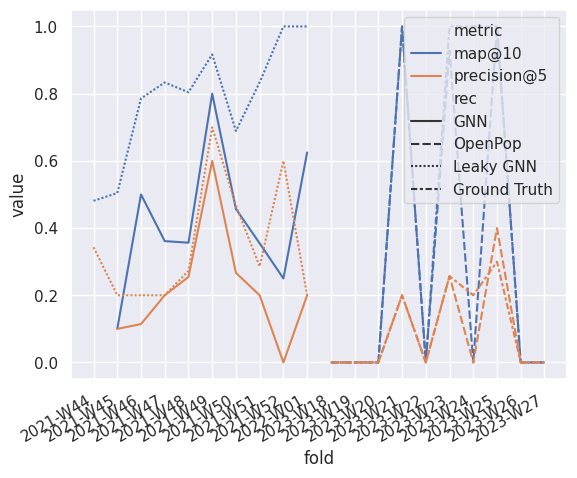

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_3812990/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3812990/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.095714,0.126715,0.0,0.000000,0.0,0.200000,0.3
GNN,precision@5,9.0,0.215055,0.166856,0.0,0.114286,0.2,0.254545,0.6
OpenPop,precision@5,10.0,0.085714,0.146308,0.0,0.000000,0.0,0.150000,0.4


Cannot show ipywidgets in text

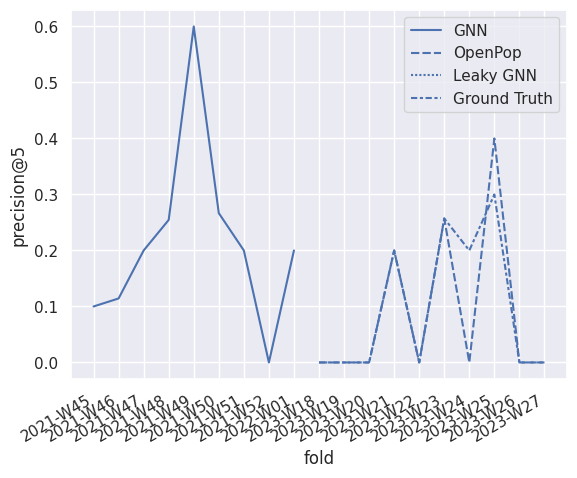

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_3812990/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3812990/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.095714,0.126715,0.0,0.000000,0.000000,0.200000,0.3
Leaky GNN,precision@5,9.0,0.347234,0.193212,0.2,0.200000,0.272727,0.466667,0.7
GNN,precision@5,9.0,0.215055,0.166856,0.0,0.114286,0.200000,0.254545,0.6
OpenPop,precision@5,10.0,0.085714,0.146308,0.0,0.000000,0.000000,0.150000,0.4


Cannot show ipywidgets in text

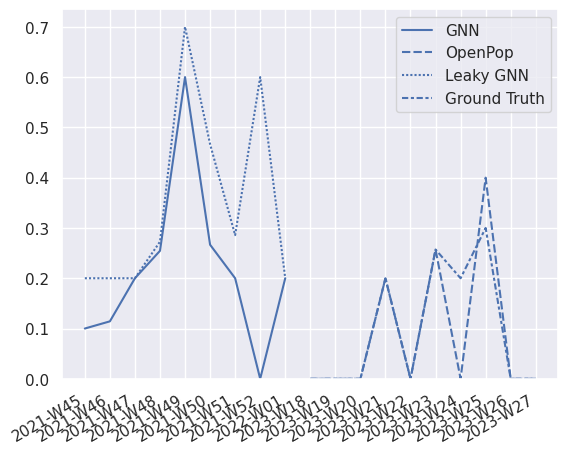

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_3812990/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3812990/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,10.0,0.400000,0.516398,0.0,0.000000,0.000000,1.000000,1.0
GNN,map@10,9.0,0.422670,0.205311,0.1,0.354535,0.361111,0.500000,0.8
OpenPop,map@10,10.0,0.292857,0.471945,0.0,0.000000,0.000000,0.696429,1.0


Cannot show ipywidgets in text

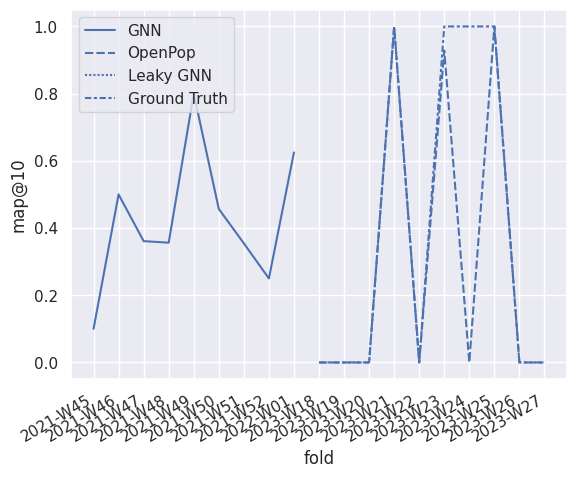

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_3812990/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3812990/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.400000,0.516398,0.00000,0.000000,0.000000,1.00000,1.000000
GNN,ndcg@10,9.0,0.552348,0.184148,0.22807,0.497312,0.518704,0.62912,0.895193
OpenPop,ndcg@10,10.0,0.244728,0.414784,0.00000,0.000000,0.000000,0.37500,1.000000


Cannot show ipywidgets in text

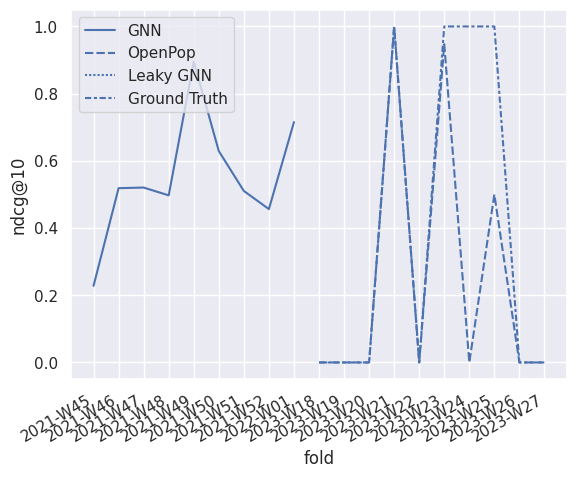

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_3812990/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3812990/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.400000,0.516398,0.00000,0.000000,0.000000,1.00000,1.000000
Leaky GNN,ndcg@10,9.0,0.869007,0.115969,0.62974,0.811310,0.876977,0.95986,1.000000
GNN,ndcg@10,9.0,0.552348,0.184148,0.22807,0.497312,0.518704,0.62912,0.895193
OpenPop,ndcg@10,10.0,0.244728,0.414784,0.00000,0.000000,0.000000,0.37500,1.000000


Cannot show ipywidgets in text

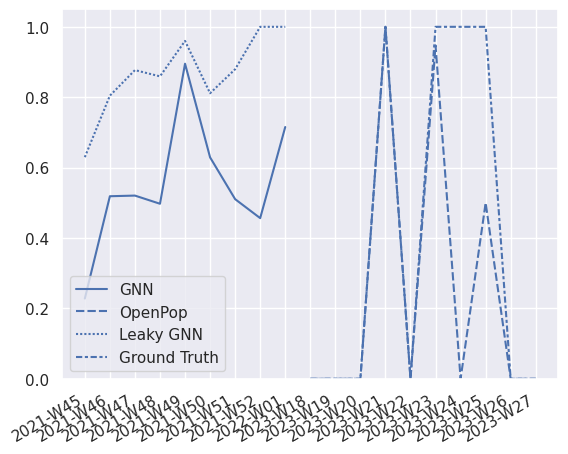

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')